In [6]:
%pip install -q numpy matplotlib opencv-python ipympl plotly scipy nbformat

Note: you may need to restart the kernel to use updated packages.


In [1]:
# import of the libraries
import numpy as np
%matplotlib widget
import matplotlib.pyplot as plt
import cv2 as cv

import plotly.express as px  # figure: display in 3D
import plotly.graph_objects as go

import scipy as sp # library: signal processing
from scipy import signal

import time # library: computation time

# Frequency domain and filtering

The lab goal is first to well understand the 2D Fourier transform 
and next to apply it to the filtering.

## 2D Fourier transform

**Note :** The FFT is a fast implementation of the discrete Fourier transform. 

### Spectrum of the 2D sinus

#### Easy cases 

The goal is to observe what is (the image of) a 2D sinus and its corresponding spectrum. 

Check and run de code below. 

Change (at the begining, one at a time) the parameters:

* _periode_ (for instance try with 16, 32, 64 [pixels]), 
* _orientation_ (try with 0, _np.pi/2_, _np.pi/4_ [radian]), 
* _amplitude_ (try with 32, 64), 
* and _val_moy_ (try with 0, 64)

Observe and answer the questions. 

In [2]:
""" function definition used in order to generate a 2D sinus"""

def generation_sinus(taille, periode, orientation, amplitude, val_moy) :
    # taille: image size
    # periode : period in pixels
    # orientation : orientation in radian
    # amplitude : amplitude
    # val_moy : mean value

    # offset in order to set the rotation point (zero) at the image center
    offset0 = int(taille/2) - 1 

    f = range(-offset0, offset0 + 2) # it's different than with octave...
    [Fl,Fc] = np.meshgrid(f,f)

    image = val_moy + amplitude*np.sin(2*np.pi*(1/periode)*(Fl*np.cos(orientation)+Fc*np.sin(orientation)))
    image = np.floor(image)
    
    return image

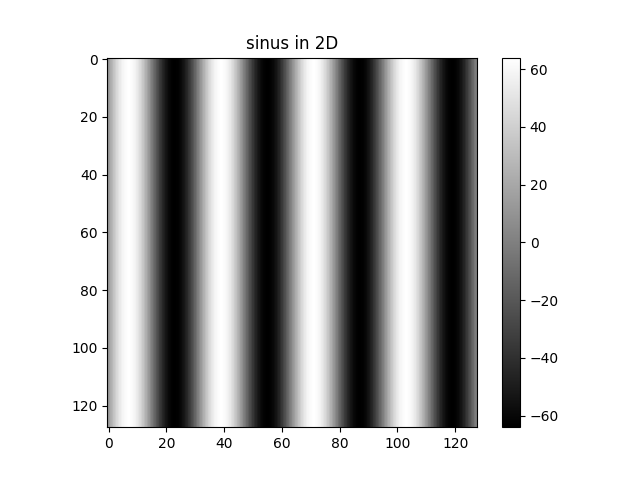

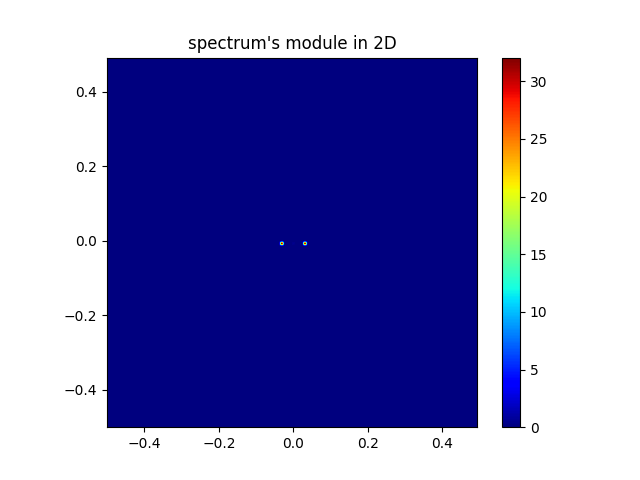

In [6]:
# 2D sinus parameters 
taille = 128   
periode = 32 # try 16, 32, 64 [pixels]
orientation = 0 # try : np.pi/2, np.pi/4 [radian]
amplitude = 64 # try : 32
val_moy = 0 # try : 64

# 2D sinus generation 
image = generation_sinus(taille, periode, orientation, amplitude, val_moy);

# 2D sinus display in 2D
grey_map = plt.cm.gray 
plt.close("all")
plt.figure()
plt.imshow(image, grey_map)
plt.colorbar()
plt.title("sinus in 2D")

# 2D sinus display in 3D

xgv = range(128)
ygv = range(128)
[X,Y] = np.meshgrid(xgv, ygv) # meshgrid computation

fig = go.Figure(data=[go.Surface(x=X, y=Y, z=image)])
fig.update_layout( title_text="sinus in 3D", title_x=0.5)
fig.show()

# FFT computation
spectre = np.fft.fft2(image) / (taille*taille)
spectre = np.fft.fftshift(spectre) # centering

# spectrum's module display in 2D
plt.figure()
plt.imshow(abs(spectre), plt.cm.jet, extent = [-0.5 , 0.5-1/taille, -0.5 , 0.5-1/taille])
plt.colorbar()
plt.title("spectrum's module in 2D")

# spectrum's module display in 3D

xgv = np.arange(-0.5, 0.5, 1/taille )
ygv = np.arange(-0.5, 0.5, 1/taille)
[X,Y] = np.meshgrid(xgv, ygv) # meshgrid computation

fig = go.Figure(data=[go.Surface(x=X, y=Y, z=abs(spectre))])
fig.update_layout( title_text="sinus in 3D", title_x=0.5)
fig.show()


**Questions:**

By definition, how is the spectrum's module of a 1D sinus ? 

When generating the 2D sinus, 
what are the effects of these parameters _periode_, _orientation_, _amplitude_ and _val_moy:

* in the spatial domain ?
* and after FFT,  in the frequency domain ?


**Responses**:
    

#### More complex cases 

Set the _periode = 17_ [pixels] and the display the spectrum's module.

**Questions:**

What does happen? Explain why? 



The image used here has a resolution of 128 by 128. If the period is set to 17, the resulting representation of the sine wave no longer aligns with the pixels of the image. The resulting offset on the sampling makes it so secondary values from the Fourier transform appear.

We want to increase the spectrum resolution, a simple **zero-padding** permits it. 
Note that the _np.fft.fft2()_ imlements directly the method (see the code after).

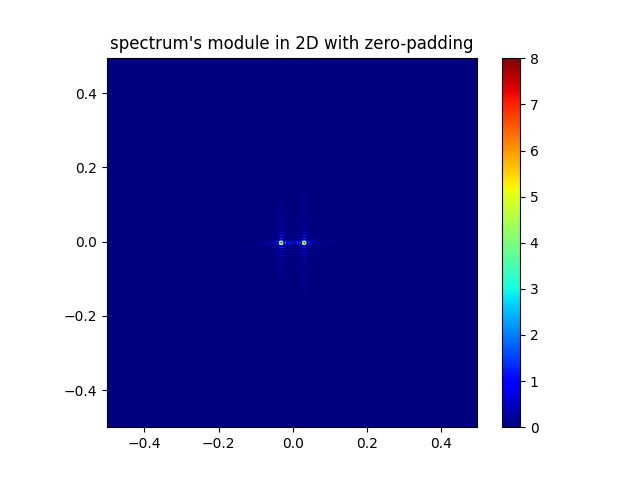

In [7]:
# new resolution 
new_taille = 2*taille

# FFT computation with zero-padding
spectre = np.fft.fft2(image, (new_taille,new_taille)) / (new_taille*new_taille)
spectre = np.fft.fftshift(spectre) # centering

# spectrum's module display in 2D
plt.figure()
plt.imshow(abs(spectre), plt.cm.jet , extent = [-0.5 , 0.5-1/new_taille, -0.5 , 0.5-1/new_taille])
plt.colorbar()
plt.title("spectrum's module in 2D with zero-padding")

# spectrum's module display in 3D
xgv = np.arange(-0.5, 0.5, 1/new_taille )
ygv = np.arange(-0.5, 0.5, 1/new_taille)
[X,Y] = np.meshgrid(xgv, ygv) # meshgrid computation

fig = go.Figure(data=[go.Surface(x=X, y=Y, z=abs(spectre))])
fig.update_layout( title_text="sinus in 3D with zero-padding", title_x=0.5)
fig.show()

**Questions:**

Explain the principle of the zero-padding in 1D.

Observe the new spectrum'module with zero padding. 
Is it the same information as before? Explain.

**Responses:**


### Spectrum of natural image

By definition a natural image is not synthetic, 
it means that it has been shot by using a camera.

Write the code in order to:
* load the _cameraman.tif_
* display it 
* compute its FFT 
* display in 2D the corresponding spectrum's module (see the note below)

**Note:**

Because the AC coefficients of the FFT are very low compare to the DC one 
(which is the mean value of the pixels),  
when displaying the spectrum's module 
it is more interesting to use 
_np.log(abs(spectre))_ than directly _np.abs(spectre)_.

Try with another image (for instance _circuit.tif_).


Type of each element: float32
Max of lena_gray: 0.99215686


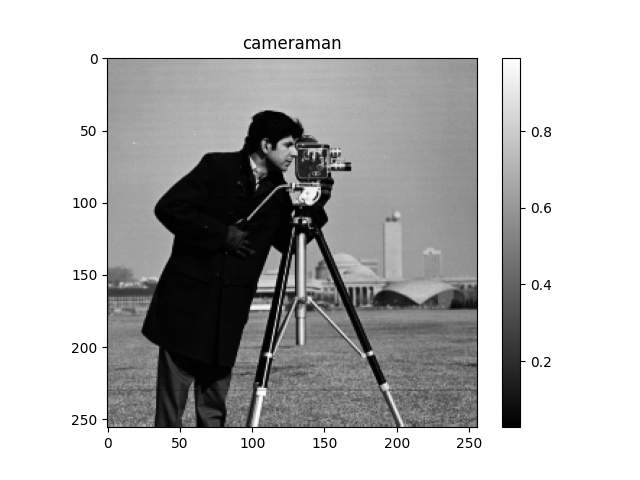

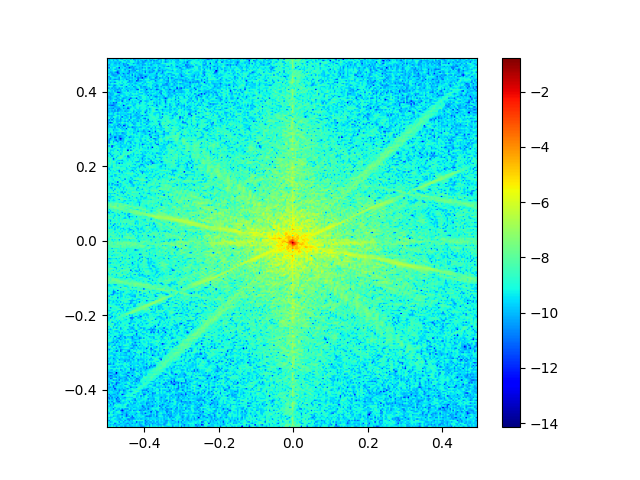

In [15]:

# image loading
image = plt.imread('../standard_test_images/cameraman.png')

print('Type of each element:', image.dtype)
print('Max of lena_gray:', image.max())
   
# image display
plt.close("all")
plt.figure()
plt.title("cameraman")
plt.imshow(image, grey_map)
plt.colorbar()
 
## FFT computation
spectre = np.fft.fft2(image) / image.size
spectre = np.fft.fftshift(spectre)

## spectrum's module display 
plt.figure()
plt.imshow(np.log(abs(spectre)), plt.cm.jet, extent = [-0.5, 0.5-1/taille, -0.5, 0.5-1/taille])
plt.colorbar()



**Questions:**

- Characterize the natural image's spectrum? 
- How the information of the gray level image is displayed in the spectrum? Why using a _log_ function?
- What are the pros and cons  of this spectrum representation?


The information of the image is mostly visible towards the center of the spectrum, and is a little hard to see. The log function makes the lower values more visible, thus making the spectrum easier to see.

The main problem of this spectrum representation is the loss of positional information.


## Frequency filtering and spatial filtering 

The goal is to study the filtering in the frequency domain.

**Note:**

We define $h(m,n)$ as the kernel filter in the spatial domain, 
and $H(m,n)$ its corresponding transfer function. 
The image filtering equation in the spatial domain is: 
\begin{equation*}
i_o(m,n) = i_i(m,n) * h(m,n)
\end{equation*}
and it becomes in the frequency domain:
\begin{equation*}
I_o(m,n) = I_i(m,n) \times H(m,n)
\end{equation*}
where: 
* $*$ is a convolution product
* $\times$ an element-wise mutiplication 
* $i_i$ the input image (resp. $i_o$ the ouput image), and $I_i$ its transformation after FFT (resp. $I_o$).   

### Lowpass filter

#### Transfer function of a mean filter 

We consider that $h(m,n)$ is the kernel of a mean filter with size $(17 \times 17)$.

Code the following steps: 

* define the kernel $h(m,n)$
* compute its FFT 
* display the spectrum's module in 2D and in 3D. 


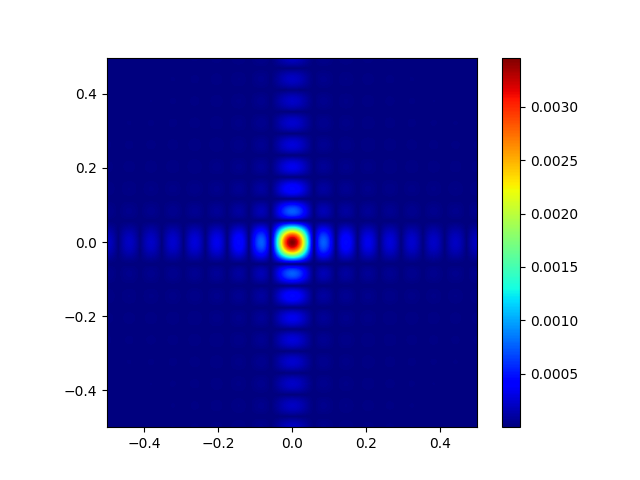

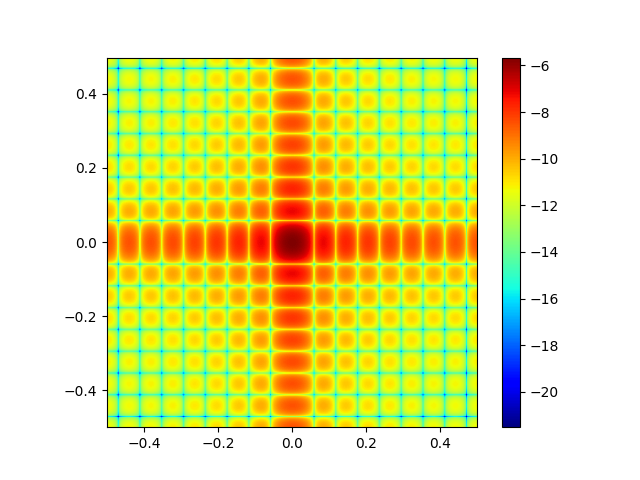

In [17]:
# RAZ plt.figure()
plt.close("all")

# we assume the filtered image's size is (512 x 512)
taille = 512

# mean filter's kernel
support = 17 # 5 
h1 = np.ones((support, support)) / (support*support)

# FFT computation
H1 = np.fft.fftshift(np.fft.fft2(h1,(taille,taille))) / (support*support)

# spectrum's module display in 2D
plt.figure()
plt.imshow(abs(H1), plt.cm.jet, extent = [-0.5, 0.5-1/taille, -0.5, 0.5-1/taille])
plt.colorbar()

# spectrum's module display in 3D
xgv = np.arange(-0.5, 0.5, 1/taille )
ygv = np.arange(-0.5, 0.5, 1/taille)
[X,Y] = np.meshgrid(xgv, ygv) # meshgrid computation

fig = go.Figure(data=[go.Surface(x=X, y=Y, z=abs(H1))])
fig.show()

# we can also display the spectre's log module (here in 2D)
plt.figure()
plt.imshow(np.log(abs(H1)), plt.cm.jet, extent = [-0.5, 0.5-1/taille, -0.5, 0.5-1/taille])
plt.colorbar()


**Questions:**
   
* Explain why this filter is also called lowpass filter.
* What does happen if the kernel's support is smaller? (for instance try with a $support=5$).


**Responses:**
   
   

#### Image filtering by using _sp.signal.convolve2d_

The goal here is to study the spatial filtering but from frequency perspectives.

Write the python code in order to:
* read the _camaraman.png_ image
* filter (spatially) it by using the _sp.signal.convolve2d_ function which computes a direct convolution, and a mean kernel of size $(5\times5)$
    * with the _mode='same'_
    * without this mode
* display the filtered images
* by using _np.shape()_, print the sizes of the output images
* by using _time.time()_, print the computation time of the filtering
* compute the FFT and display the spectrums of the original image and the filtered one


Test, type of each element: float32
Test, max of the elements: 0.99215686
Computation time of the spatial filtering: 0.004782676696777344 s
Size of the original image: (256, 256)
Size of the filtered image 1: (260, 260)
Size of the filtered image 2: (256, 256)


NameError: name 'im_f' is not defined

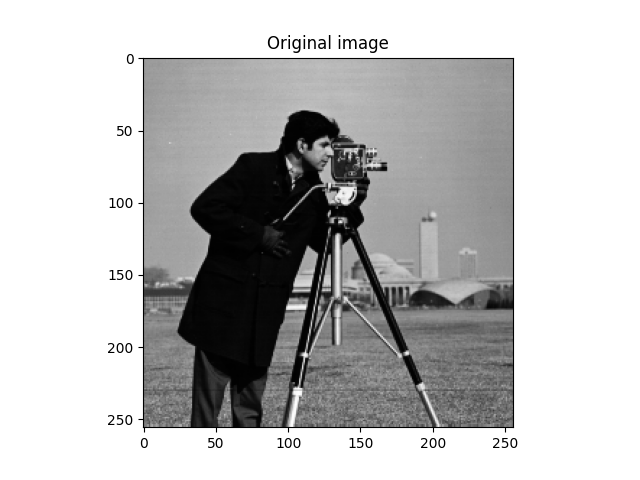

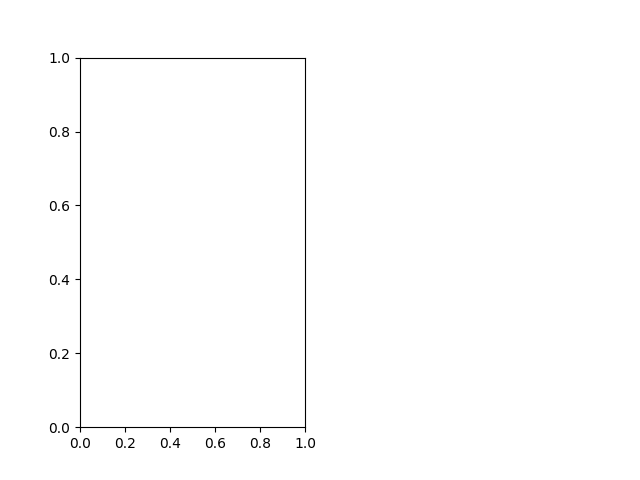

In [7]:
#RAZ plt.figure()
plt.close("all")

# image reading
im = plt.imread('../standard_test_images/cameraman.png')

# ... and normalization (if necessary)


# image display


# spatial filtering and computation time



# sizes of the images


#affichage


# FFT of the image before and after filtering

  

**Questions:**
   
* Why the size of the filtered image can be larger than the original one? 
* For the larger filtered image why there are blacker pixels around the border?
* What is the effect of the mean filter in the pixel domain?
* Explain the filtered image's spectrum aspect

**Responses:**
   

#### Filtering by using _sp.signal.fftconvolve_

So this time we use _sp.signal.fftconvolve_ which computes FFT to convolve...

**Question:**

How does this fonction proceed exactly?


**Response:**


Write the python code in order to:
* read the _camaraman.png_ image
* filter it by using the _sp.signal.fftconvolve_ function with a mean kernel of size $(5\times5)$
    * with the _mode='valid'_
    * without this mode
* display the filtered images
* by using _np.shape()_, print the sizes of the output images
* by using _time.time()_, print the computation time of the filtering
* compute the FFT and display the spectrums of the original image and the filtered one
  

Computation time of the spatial filtering: 0.006140947341918945 s
Size of the original image: (256, 256)
Size of the filtered image 1: (260, 260)
Size of the filtered image 2: (252, 252)


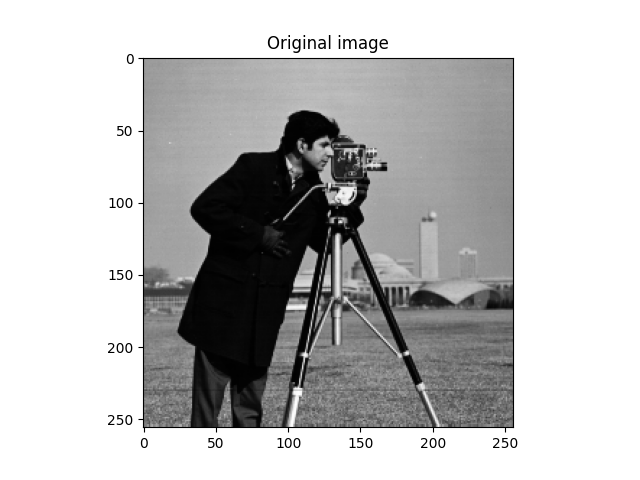

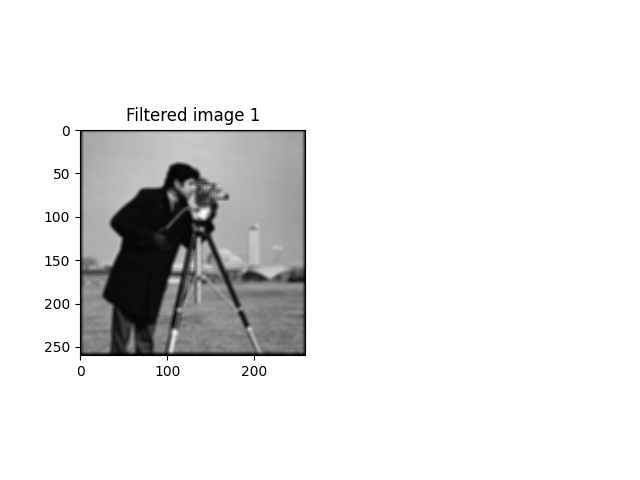

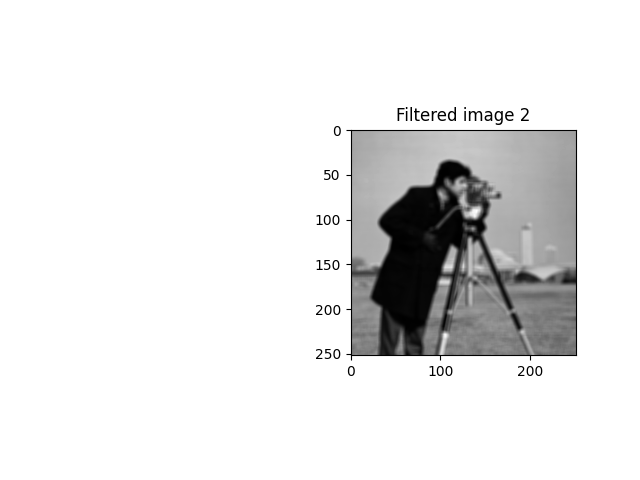

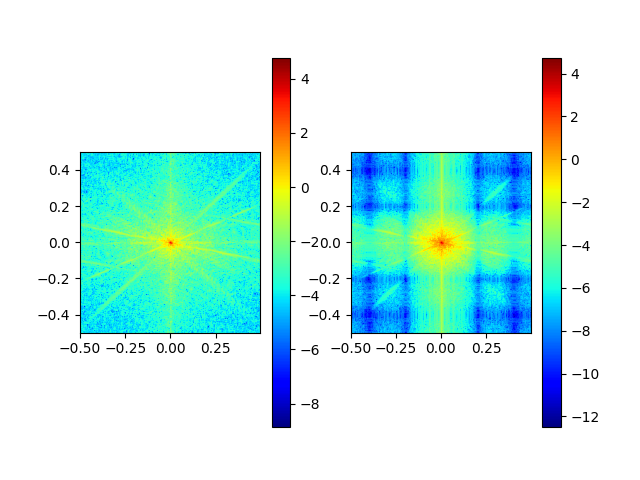

In [8]:
# Filtering and computation time

# sizes of the images

# images display


# FFT of the image before and after filtering


**Questions:**
   
* What is the effect of the _mode='valid'_ argument? 
* Is the computation time longer or shorter? Why?
* Is the filtered image's spectrum aspect different than before?

**Responses:**
   

#### Filtering by using _sp.signal.fftconvolve_

Run the same code as before but with this kernel: 

\begin{equation*} 
\begin{pmatrix}
-1 & 0 & 1 \\
-1 & \bf{0} & 1 \\
-1 & 0 & 1  
\end{pmatrix}
\end{equation*}

**Questions:**

- Analyse the filtered image, and its spectrum.

Test, type of each element: float32
Test, max of the elements: 0.99215686


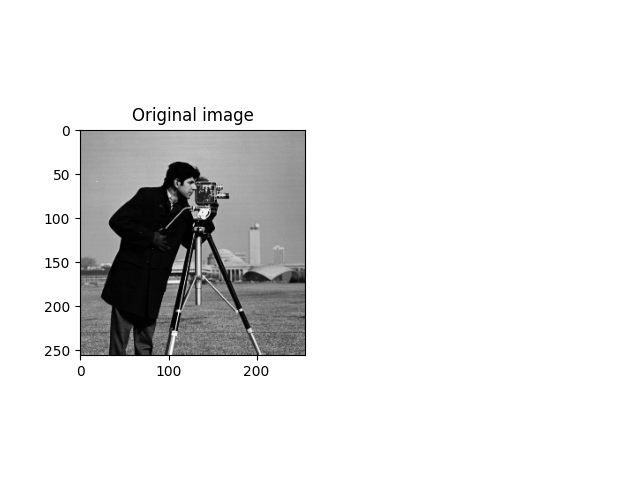

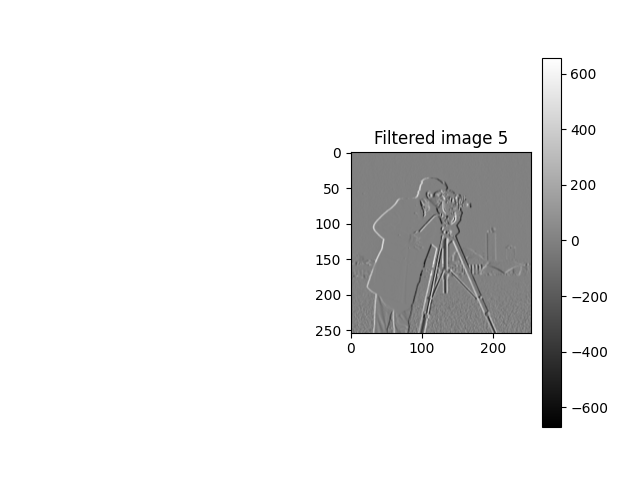

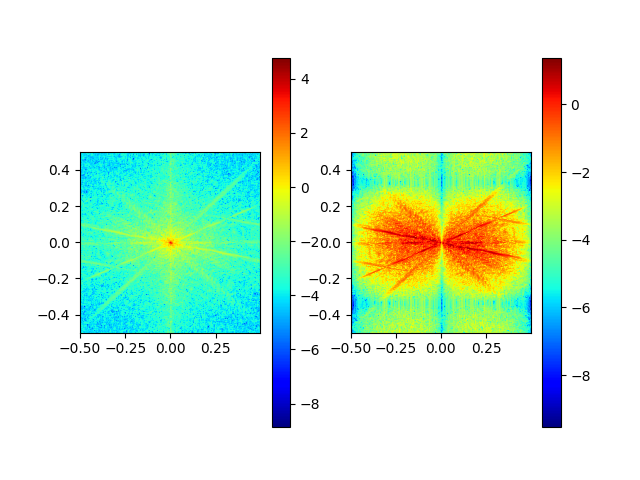

In [9]:
# RAZ (figures closing)
plt.close('all')

# image reading
im = plt.imread('../standard_test_images/cameraman.png')

# ... and normalization (if necessary)


# spatial filtering and computation time

# Filtering and computation time


# images display


# FFT of the image before and after filtering

